# Final Project: Natural Language Processing & Cognitive Computing
### University of Chicago

### Luke Schwenke
#### March 6, 2024


<center>

## Project Background

</center>

In March of 2023, Goldman Sachs published a reportLinks to an external site., indicating that ~25% of the tasks in US and Europe can be automated using AI.  However, as you can see in this visualizationLinks to an external site., not all industries will be affected equally.  According to the report, certain jobs, like office tasks, legal, architecture and social sciences have a potential for 30%+ automation, while positions like construction, installation and building maintenance are going to be largely unaffected.

You can also see supporting evidence in the Facebook Research paperLinks to an external site., which highlights Moravec’s paradox, the thesis that the hardest problems in AI involve sensorimotor skills, not abstract thought or reasoning, which coincide with Goldman Sachs predictions.

While both of these papers are very impressive, they also heavily influenced by the recent advances in Large Language Models (LLMs).  For this final project I have prepared a collection of ~200K news articles (about 900 MB) articles on our favorite topics: Data Science, Machine Learning and Artificial Intelligence, and I want you to identify what industries and job lines are going to be most impacted by the AI over the next several years, based on the information you can disseminate from this text corpus.

<center>

## Project Objective

</center>

#### The objective of the final project is to identify what types of tasks and jobs are most likely to see the biggest impact from AI by extracting meaningful insights from unstructured text.  Your goal is to provide actionable recommendations on what can be done with AI to automate the jobs and / or improve employee productivity.  Please pay attention to the introduction of novel technologies and algorithms, such as AI for image generation and Conversational AI, as they represent the entire paradigm shift in adoption of AI technologies and data science in general.

### Import Packages & Dependencies

In [385]:
import os
import time
import math
import re
from pprint import pprint
from textblob import TextBlob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import nltk as nltk
from nltk.corpus import stopwords
# from nltk.stem.wordnet import WordNetLemmatizer
import spacy
import string
import ktrain
import bokeh

from pandarallel import pandarallel
from textblob import TextBlob
import sklearn
from textblob.sentiments import NaiveBayesAnalyzer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, HashingVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn import metrics
from sklearn.pipeline import make_pipeline
import numpy as np
import eli5

import gensim
from gensim import corpora, models
from gensim.models.ldamulticore import LdaMulticore
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# import pyLDAvis.gensim
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()

from collections import defaultdict

In [5]:
import warnings
warnings.filterwarnings("ignore")

In [6]:
import multiprocessing
num_processors = multiprocessing.cpu_count()
print(f'Available CPUs: {num_processors}')

Available CPUs: 8


In [211]:
pandarallel.initialize(nb_workers=num_processors-1, use_memory_fs=False)

INFO: Pandarallel will run on 7 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


### Load Data

In [19]:
# Read the data
# Note: this is live data, so the layout and record counts in the dataframe will vary
df = pd.read_parquet('https://storage.googleapis.com/msca-bdp-data-open/news_final_project/news_final_project.parquet', engine='pyarrow')

In [20]:
print("The dataset has", df.shape[0], "rows across", df.shape[1], "columns")

The dataset has 200435 rows across 5 columns


In [21]:
print("The columns in this dataset are:", list(df.columns))

The columns in this dataset are: ['url', 'date', 'language', 'title', 'text']


In [22]:
df.head(3)

,url,date,language,title,text
0,http://galusaustralis.com/2020/02/486473/legal...,2020-02-26,en,LegalTech Artificial Intelligence Market 2019 ...,LegalTech Artificial Intelligence Market 2019 ...
1,http://newsparliament.com/2020/02/27/children-...,2020-02-27,en,Children With Autism Saw Their Learning and So...,\nChildren With Autism Saw Their Learning and ...
2,http://www.agoravox.it/Covid-19-un-messaggio-d...,2020-03-13,en,Covid-19: un messaggio dai ricercatori italian...,\n\n\nCovid-19: un messaggio dai ricercatori i...


In [250]:
df['raw_text'] = df['text']

## Cleaning

#### Eliminate newlines, tabs, remnants of web crawls, and other irrelevant text

In [388]:
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

nltk.download('words')
from nltk.corpus import words

english_words = set(words.words())
from nltk.stem.wordnet import WordNetLemmatizer
lemma = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/lmschwenke/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/lmschwenke/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [391]:
def text_cleaner(text):
    # Remove HTML tags
    text = re.sub(r'<[^>]+>', '', text)
    # Convert multiple spaces (including tabs) to a single space
    text = re.sub(r'\s+', ' ', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/\S+', '', text)
    # Remove newline characters
    text = re.sub(r'\n', ' ', text)
    # Remove carriage return characters
    text = re.sub(r'\r', '', text)
    # Remove other special characters and numbers
    #text = re.sub(r'[^A-Za-z\s]', '', text)
    # Remove special characters (keep numbers)
    text = re.sub(r'[^A-Za-z0-9\s]', '', text)
    # Remove stopwords
    text = ' '.join([word for word in text.split() if word not in stop_words])
    # Remove non-English words
    text = ' '.join([word for word in text.split() if word.lower() in english_words])
    # Lemmatize words
    text = ' '.join(lemma.lemmatize(word) for word in text.split())
    # Remove leading and trailing whitespace
    text = text.strip()

    # Optionally, convert to lowercase
    # text = text.lower()

    return text

In [392]:
df['title'] = df['title'].parallel_apply(text_cleaner)
df['text'] = df['title'].parallel_apply(text_cleaner)

#### Discard irrelevant articles

In [393]:
# Remove articles with less than 30 characters
df = df[df['text'].apply(lambda x: len(x) >= 30)]

In [394]:
# Remove duplicates (if any)
df.drop_duplicates(subset='text', inplace=True)

In [395]:
print("There are now", df.shape[0], "rows")

There are now 95431 rows


In [396]:
# Discard articles that are not relevant to Artificial Intelligence
ai_keywords = [
    "AI", "ML", "machine learning", "artificial intelligence", "deep learning", "neural networks", 
    "data science", "NLP", "natural language processing", "computer vision", "robotics", "ANN", 
    "artificial neural networks", "CNN", "convolutional neural networks", "RNN", "recurrent neural networks", 
    "GPT", "generative pre-trained transformer", "BERT", "bi-directional encoder representations from transformers", 
    "reinforcement learning", "supervised learning", "unsupervised learning", "semi-supervised learning", 
    "transfer learning", "feature extraction", "dimensionality reduction", "PCA", "principal component analysis", 
    "SVM", "support vector machines", "k-means clustering", "decision trees", "random forests", 
    "gradient boosting", "XGBoost", "LightGBM", "CatBoost", "ensemble learning", "data mining", 
    "predictive modeling", "regression analysis", "classification", "clustering", "natural language generation", 
    "image recognition", "speech recognition", "text analytics", "sentiment analysis", "chatbots", 
    "autonomous vehicles", "AI ethics", "bias in AI", "fairness in AI", "privacy in AI", "security in AI", 
    "GANs", "generative adversarial networks", "edge computing", "IoT", "Internet of Things", "big data", 
    "analytics", "data visualization", "data engineering", "feature engineering", "model deployment", 
    "model monitoring", "model evaluation", "hyperparameter tuning", "cross-validation", "data preprocessing", 
    "data cleaning", "data augmentation", "time series analysis", "sequence modeling", "embeddings", 
    "word embeddings", "graph neural networks", "quantum computing", "blockchain", "augmented reality", 
    "virtual reality", "cybersecurity", "metadata", "algorithmic bias", "explainable AI", "XAI", 
    "federated learning", "cloud computing", "edge AI", "AI governance", "AI in healthcare", "AI in finance", 
    "AI in education", "AI in agriculture", "AI in manufacturing", "AI in retail", "AI in entertainment", 
    "AI policy", "AI regulation", "AI standards", "open source AI", "AI research", "AI applications", 
    "AI trends", "deepfake", "synthetic data", "data integrity", "data privacy", "data security", 
    "scalable AI", "sustainable AI", "AI for social good", "AI for accessibility", "multimodal AI", 
    "voice assistants", "predictive maintenance", "customer segmentation", "recommendation systems", 
    "search algorithms", "optimization", "natural language understanding", "knowledge graphs", 
    "semantic search", "deep reinforcement learning", "AI strategy", "AI integration", "AI transformation", 
    "AI innovation", "AI impact", "AI ethics guidelines", "AI best practices", "AI literacy", "LLM", "Language Model", 
    "Large Language Model", "ChatGPT", "OpenAI"
]


In [397]:
# Convert the 'text' column to lowercase for comparison
df['text_lower'] = df['text'].str.lower()

# Filter rows where at least one keyword is in the 'text' column
filtered_df = df[df['text_lower'].apply(lambda x: any(keyword in x for keyword in ai_keywords))]

# Drop the auxiliary 'text_lower' column if no longer needed
filtered_df = filtered_df.drop(columns=['text_lower'])

In [398]:
print("There are now", filtered_df.shape[0], "in the filtered df")

There are now 26631 in the filtered df


In [399]:
# Combine the title and text into a single column
df['title_and_text'] = df['title'] + ' ' + df['text']

In [400]:
df.reset_index(drop=True, inplace=True)

### Define additional helper functions

* *sent_to_words:* converts individual sentences into words
* *make_bi_and_tri_grams:*

In [34]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

In [35]:
def make_bi_and_tri_grams(texts):
    
    bigram = gensim.models.Phrases(texts, min_count=1, threshold=1)
    bigram_mod = gensim.models.phrases.Phraser(bigram)

    trigram = gensim.models.Phrases(bigram[texts], threshold=1)
    trigram_mod = gensim.models.phrases.Phraser(trigram)

    return [trigram_mod[bigram_mod[doc]] for doc in texts]

In [36]:
nlp = spacy.load("en_core_web_lg", disable=['parser', 'ner'])

In [38]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [39]:
def prepare_data(column):

    # Tokenize text into words (other punctuation and elements have been cleaned in earlier function)
    data_list = column.tolist()
    data_tokens = list(sent_to_words(data_list))

    # Make n-grams
    data_words_trigrams = make_bi_and_tri_grams(data_tokens)

    # Lemmatize text keeping only noun, adj, vb, adv
    data_lemmatized = lemmatization(data_words_trigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

    return data_lemmatized

## Topic Modeling - Detect major topics (Method #1: Zero Shot)

In [60]:
import tensorflow as tf
import ktrain

In [57]:
#Verify we got CPU + GPU or only CPU
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [58]:
!nvidia-smi

zsh:1: command not found: nvidia-smi


In [61]:
zsl = ktrain.text.ZeroShotClassifier()

In [97]:
label_set_one = ['technology and innovation', 'healthcare and medicine', 'finance and banking', 'education', 'manufacturing', 'agriculture', 'retail and e-commerce', 
                 'transportation and logistics', 'energy and utilities', 'construction', 'legal and policy', 'arts and entertainment']
label_set_two = ['generative ai', 'nlp', 'computer vision', 'robotics and automation', 'data analytics', 'quantum computing', 'blockchain']
label_set_three = ['employment and jobs', 'education and skills', 'ethics and privacy', 'regulation and policy']

In [163]:
randomize_records = df['title_and_text'].sample(n=10000, replace=False, random_state=456) 

In [93]:
from collections import Counter

def get_topics_with_zero_shot(documents, label_set):
    topics = []
    for doc in documents:
        nli_labels = zsl.predict(doc, labels=label_set, include_labels=True)
        relevances = pd.DataFrame(nli_labels, columns=['Label', 'Relevance']).sort_values(by=['Relevance'], ascending=False).reset_index(drop=True)
        top_relevance = relevances['Label'][0]
        topics.append(top_relevance)
    
    topics_and_counts = Counter(topics)
    return topics_and_counts

In [96]:
zero_shot_topic_results = get_topics_with_zero_shot(documents=randomize_records, label_set=label_set_one)
print(zero_shot_topic_results)

Counter({'technology and innovation': 874, 'healthcare and medicine': 41, 'arts and entertainment': 19, 'legal and policy': 16, 'education': 14, 'finance and banking': 12, 'construction': 7, 'transportation and logistics': 6, 'agriculture': 5, 'retail and e-commerce': 3, 'energy and utilities': 2, 'manufacturing': 1})


In [98]:
zero_shot_topic_results = get_topics_with_zero_shot(documents=randomize_records, label_set=label_set_two)
print(zero_shot_topic_results)

Counter({'generative ai': 314, 'robotics and automation': 243, 'data analytics': 232, 'nlp': 169, 'computer vision': 39, 'quantum computing': 3})


In [99]:
zero_shot_topic_results = get_topics_with_zero_shot(documents=randomize_records, label_set=label_set_three)
print(zero_shot_topic_results)

Counter({'employment and jobs': 627, 'regulation and policy': 220, 'education and skills': 111, 'ethics and privacy': 42})


## Topic Modeling - Detect major topics (Method #2: LDA with KTrain)

In [401]:
lda_texts = df['title_and_text'].tolist()

In [410]:
lda = ktrain.text.get_topic_model(
    texts=lda_texts, 
    n_topics=5, 
    n_features=15000, 
    min_df=5, 
    max_df=0.5, 
    stop_words='english', 
    model_type='lda', 
    lda_max_iter=50, 
    verbose=1)

lang: en
preprocessing texts...
fitting model...
iteration: 1 of max_iter: 50
iteration: 2 of max_iter: 50
iteration: 3 of max_iter: 50
iteration: 4 of max_iter: 50
iteration: 5 of max_iter: 50
iteration: 6 of max_iter: 50
iteration: 7 of max_iter: 50
iteration: 8 of max_iter: 50
iteration: 9 of max_iter: 50
iteration: 10 of max_iter: 50
iteration: 11 of max_iter: 50
iteration: 12 of max_iter: 50
iteration: 13 of max_iter: 50
iteration: 14 of max_iter: 50
iteration: 15 of max_iter: 50
iteration: 16 of max_iter: 50
iteration: 17 of max_iter: 50
iteration: 18 of max_iter: 50
iteration: 19 of max_iter: 50
iteration: 20 of max_iter: 50
iteration: 21 of max_iter: 50
iteration: 22 of max_iter: 50
iteration: 23 of max_iter: 50
iteration: 24 of max_iter: 50
iteration: 25 of max_iter: 50
iteration: 26 of max_iter: 50
iteration: 27 of max_iter: 50
iteration: 28 of max_iter: 50
iteration: 29 of max_iter: 50
iteration: 30 of max_iter: 50
iteration: 31 of max_iter: 50
iteration: 32 of max_iter: 50


#### Compute the Document-Topic Matrix

In [411]:
lda.build(lda_texts, threshold=0.25)

done.


In [412]:
lda.print_topics(show_counts=True)

topic:0 | count:22946 | news technology times tech use world latest new china chief
topic:1 | count:21959 | intelligence artificial market global growth analysis forecast industry report future
topic:4 | count:20288 | data business generative science platform new digital cloud express financial
topic:2 | count:18115 | new daily help product tool health stock make hunt model
topic:3 | count:10711 | learning machine research bard medical company security vision computer post


In [413]:
doc_topics=lda.get_doctopics()

In [414]:
lda.visualize_documents(doc_topics=lda.get_doctopics())

reducing to 2 dimensions...[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 94019 samples in 0.021s...
[t-SNE] Computed neighbors for 94019 samples in 1.530s...
[t-SNE] Computed conditional probabilities for sample 1000 / 94019
[t-SNE] Computed conditional probabilities for sample 2000 / 94019
[t-SNE] Computed conditional probabilities for sample 3000 / 94019
[t-SNE] Computed conditional probabilities for sample 4000 / 94019
[t-SNE] Computed conditional probabilities for sample 5000 / 94019
[t-SNE] Computed conditional probabilities for sample 6000 / 94019
[t-SNE] Computed conditional probabilities for sample 7000 / 94019
[t-SNE] Computed conditional probabilities for sample 8000 / 94019
[t-SNE] Computed conditional probabilities for sample 9000 / 94019
[t-SNE] Computed conditional probabilities for sample 10000 / 94019
[t-SNE] Computed conditional probabilities for sample 11000 / 94019
[t-SNE] Computed conditional probabilities for sample 12000 / 94019
[t-SNE] Computed condit

/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/ktrain/utils.py:652: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(name, n)
/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/bokeh/io/notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


Loading BokehJS ...

/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/bokeh/io/notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/bokeh/io/notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/bokeh/io/notebook.py:487: DeprecationWarning: The `source` parameter emit a  deprecation warning since IPython 8.0, it had no effects for a long time and will  be removed in future versions.
  publish_display_data(data, metadata, source, transient=transient, **kwargs)


## Topic Modeling - Detect major topics (Method #3: LDA) - NOT DONE

In [50]:
topic_data_lemmatized = prepare_data(df['title_and_text'])

In [52]:
def compute_coherence_values(corpus, dictionary, k, a, b, texts_lemmatized):
    
    lda_model = LdaMulticore(corpus=doc_term_matrix,
                       id2word=dictionary,
                       num_topics=k,
                       random_state=100,                  
                       passes=10,
                       alpha=a,
                       eta=b,
                       workers=num_processors-1)
    
    coherence_model_lda = CoherenceModel(model=lda_model, 
                                         texts=texts_lemmatized, 
                                         dictionary=dictionary, 
                                         coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [ ]:
# Extracting topics
for topic in topic_model.get_topic_info().itertuples():
    print(f"Topic {topic.Topic}: {topic.Name}")

# Optionally, visualize the topics
topic_model.visualize_topics()

## Sentiment Analysis - Huggingface

In [164]:
from collections import defaultdict

def get_topics_with_indices(documents, label_set):
    topics = defaultdict(list)  # Use a dictionary to store indices by topic
    for index, doc in enumerate(documents):
        nli_labels = zsl.predict(doc, labels=label_set, include_labels=True)
        relevances = pd.DataFrame(nli_labels, columns=['Label', 'Relevance']).sort_values(by=['Relevance'], ascending=False).reset_index(drop=True)
        top_relevance = relevances['Label'][0]
        topics[top_relevance].append(index)  # Store the index instead of topic name
    
    return topics

In [166]:
# Get the articles on GenAI
document_indices_by_topic = get_topics_with_indices(documents=randomize_records, label_set=label_set_two)

In [170]:
generative_ai_indices = document_indices_by_topic['generative ai']
df_generative_ai = df.iloc[generative_ai_indices].reset_index(drop=True)

In [171]:
print("There are", df_generative_ai.shape[0], "articles")

There are 3188 articles


In [106]:
#!pip install -q transformers
from transformers import pipeline

In [ ]:
pipe = pipeline("text-classification", 
                model="mrm8488/distilroberta-finetuned-financial-news-sentiment-analysis")

In [168]:
# For the topics on Generative AI, what is the sentiment?
sentiments = [pipe(doc)[0]['label'] for doc in df_generative_ai['title_and_text']]
sentiment_counts = Counter(sentiments)

In [169]:
print("The sentiment for generative AI are as follows:")
sentiment_counts

The sentiment for generative AI are as follows:


Counter({'neutral': 2699, 'positive': 400, 'negative': 89})

In [ ]:
# Plot the Generative AI articles over time

In [177]:
df_generative_ai['sentiments'] = sentiments

In [187]:
df_generative_ai[['date', 'sentiments']].head(20)

,date,sentiments
0,2020-04-29,neutral
1,2020-08-28,positive
2,2023-08-18,neutral
3,2023-08-17,positive
4,2023-07-06,neutral
5,2021-06-30,neutral
6,2023-07-15,neutral
7,2021-04-16,neutral
8,2020-09-10,positive
9,2023-05-19,neutral


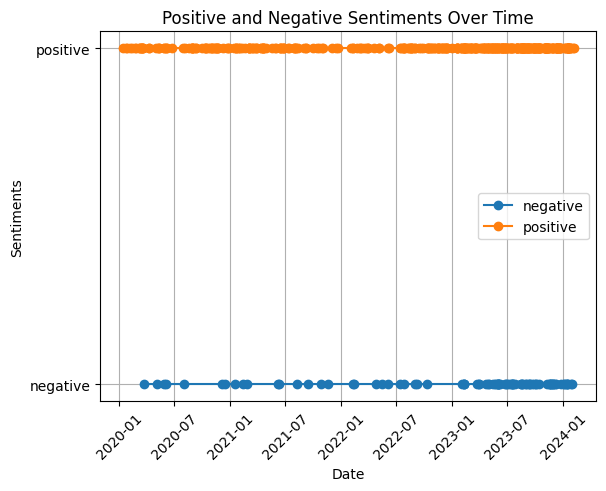

In [191]:
df_filtered = df_generative_ai_sorted_updated[df_generative_ai_sorted_updated['sentiments'].isin(['positive', 'negative'])]

# Plotting a line plot for only positive and negative sentiments
fig, ax = plt.subplots()
for sentiment, group in df_filtered.groupby('sentiments'):
    ax.plot(group['date'], group['sentiment_value'], label=sentiment, marker='o')

# Adjusting the y-axis to show sentiment labels instead of numerical values
# Since we only have positive (and potentially negative) sentiments, adjust the ticks accordingly
ax.set_yticks([0, 2])
ax.set_yticklabels(['negative', 'positive'])

ax.set_xlabel('Date')
ax.set_ylabel('Sentiments')
ax.set_title('Positive and Negative Sentiments Over Time')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

In [442]:
positive_genai = df_generative_ai[df_generative_ai['sentiments']=='positive']
negative_genai = df_generative_ai[df_generative_ai['sentiments']=='negative']

print('There are', positive_genai.shape[0], 'positive sentiment generative AI articles')
print('There are', negative_genai.shape[0], 'negative sentiment generative AI articles')

There are 400 positive sentiment generative AI articles
There are 89 negative sentiment generative AI articles


/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


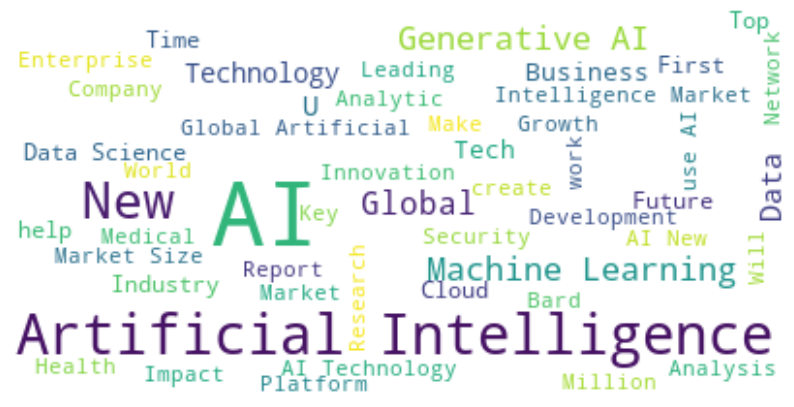

In [432]:
# Import necessary libraries
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_generative_ai is your DataFrame and it's already loaded
# If not, you would need to load it here. For example:
# df_generative_ai = pd.read_csv('your_file.csv') or any other method to load your DataFrame

# Concatenate all text from the 'title_and_text' column
text = ' '.join(row for row in df_generative_ai['title_and_text'])

# Generate a word cloud image, limiting to the top 50 words
wordcloud = WordCloud(background_color='white', max_words=50).generate(text)

# Display the generated image
plt.figure(figsize=(10, 8))  # You can adjust the size to fit your needs
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()


/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


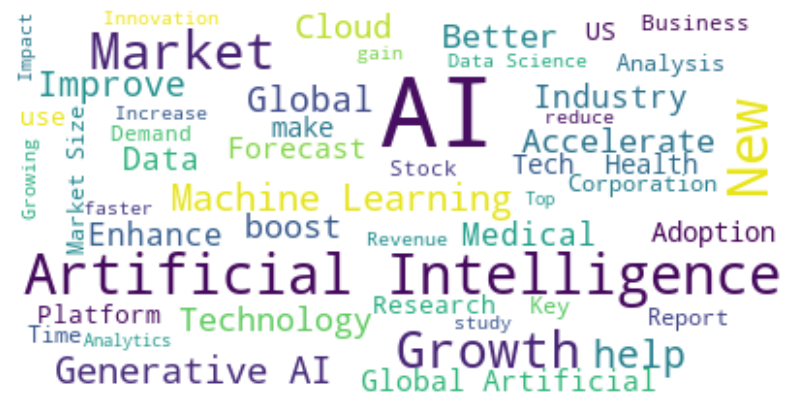

In [439]:
# Import necessary libraries
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_generative_ai is your DataFrame and it's already loaded
# If not, you would need to load it here. For example:
# df_generative_ai = pd.read_csv('your_file.csv') or any other method to load your DataFrame

# Concatenate all text from the 'title_and_text' column
text = ' '.join(row for row in positive_genai['title_and_text'])

# Generate a word cloud image, limiting to the top 50 words
wordcloud = WordCloud(background_color='white', max_words=50).generate(text)

# Display the generated image
plt.figure(figsize=(10, 8))  # You can adjust the size to fit your needs
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()


/Users/lmschwenke/miniconda3/lib/python3.10/site-packages/wordcloud/wordcloud.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


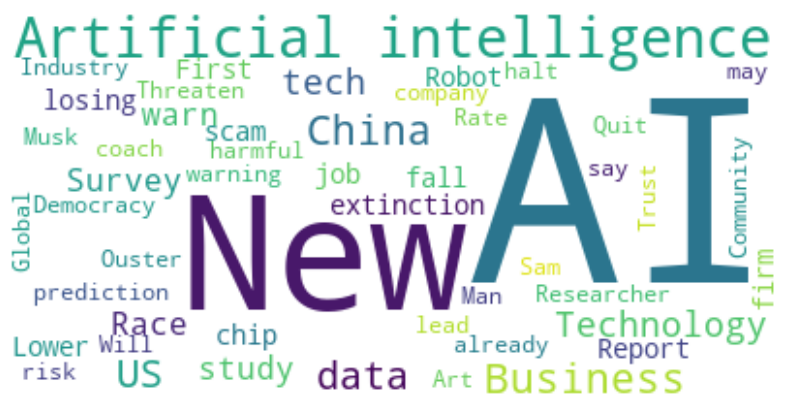

In [443]:
# Import necessary libraries
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming df_generative_ai is your DataFrame and it's already loaded
# If not, you would need to load it here. For example:
# df_generative_ai = pd.read_csv('your_file.csv') or any other method to load your DataFrame

# Concatenate all text from the 'title_and_text' column
text = ' '.join(row for row in negative_genai['title_and_text'])

# Generate a word cloud image, limiting to the top 50 words
wordcloud = WordCloud(background_color='white', max_words=50).generate(text)

# Display the generated image
plt.figure(figsize=(10, 8))  # You can adjust the size to fit your needs
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.show()


#### Summarize the negative and positive sentiment Generative AI articles

In [452]:
bart_pipe = pipeline("summarization", model="facebook/bart-large-cnn")

In [456]:
def batch_summarize(texts, summarizer, batch_size=10):
    summaries = []
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        concatenated_text = ' '.join(batch)
        # Summarize the concatenated text of the current batch
        summary = summarizer(concatenated_text, max_length=130, min_length=30, do_sample=False, truncation=True)
        summaries.append(summary[0]['summary_text'])
    return summaries

In [460]:
# Summarize the GenAI negative and positive articles
#sam = df_persons_exploded[df_pearsons_exploded['persons']=='Sam'].reset_index(drop=True)
pos = positive_genai[['title_and_text', 'date']]
print(pos.shape[0])

texts = pos['title_and_text'].tolist()

400


In [466]:
# Extract the text column as a list
texts = pos['title_and_text'].tolist()#meta['title_and_text'].tolist()

# First level of summarization (you might need to adjust the batch_size based on your text sizes and limits)
initial_summaries = batch_summarize(texts, bart_pipe, batch_size=50)  # Adjust batch_size as needed

In [467]:
combined_text = ' '.join(texts)

# Truncate the combined text to fit within the model's maximum input length
max_input_length = 1024  # Adjust this value according to the model's maximum input length
truncated_text = combined_text[:max_input_length]

In [468]:
# Initialize summarization pipeline
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Generate summary for the truncated text
summary = summarizer(truncated_text, max_length=130, min_length=30, do_sample=False)
print(summary)

[{'summary_text': 'Artificial Intelligence AI Market Share Demand Growth Rate With Top Alphabet Blue Frog ABB Harman International Bulletin Line. boost artificial intelligence speed diagnosis deadly. Tech partner accelerate AI Adoption. These AI Stocks Have Potential Surge Big This Summer.'}]


In [469]:
# Second level of summarization - summarizing the summaries
final_summary = bart_pipe(' '.join(initial_summaries), max_length=150, min_length=30, do_sample=False)

print('POSITIVE GENERATIVE AI ARTICLES SUMMARY:\n', final_summary[0]['summary_text'])

POSITIVE GENERATIVE AI ARTICLES SUMMARY:
 AI sector saw big job gains recently wont unscathed downturn report. AI sector has potential to Surge Big This Summer. These AI Stocks Have Potential Surge Big this Summer. AI Solution Enhance Wind Solar Storage Asset Performance Increase Energy Production.


In [471]:
# Summarize the GenAI negative and positive articles
#sam = df_persons_exploded[df_pearsons_exploded['persons']=='Sam'].reset_index(drop=True)
neg = negative_genai[['title_and_text', 'date']]
print(neg.shape[0])

texts = neg['title_and_text'].tolist()

89


In [472]:
# Extract the text column as a list
texts = neg['title_and_text'].tolist()#meta['title_and_text'].tolist()

# First level of summarization (you might need to adjust the batch_size based on your text sizes and limits)
initial_summaries = batch_summarize(texts, bart_pipe, batch_size=50)  # Adjust batch_size as needed

In [473]:
combined_text = ' '.join(texts)

# Truncate the combined text to fit within the model's maximum input length
max_input_length = 1024  # Adjust this value according to the model's maximum input length
truncated_text = combined_text[:max_input_length]

In [474]:
# Initialize summarization pipeline
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Generate summary for the truncated text
summary = summarizer(truncated_text, max_length=130, min_length=30, do_sample=False)
print(summary)

[{'summary_text': 'US AI chip China would cause permanent loss Business warn Artificial intelligence could lead human extinction warn Artificial Intelligence could leadhuman extinction Nearly All Staff Threaten Quit Join After Sam Ouster Technology News fire coach amid losing stretch fire coach Amid losing stretch.'}]


In [475]:
# Second level of summarization - summarizing the summaries
final_summary = bart_pipe(' '.join(initial_summaries), max_length=150, min_length=30, do_sample=False)

print('NEGATIVE GENERATIVE AI ARTICLES SUMMARY:\n', final_summary[0]['summary_text'])

NEGATIVE GENERATIVE AI ARTICLES SUMMARY:
 Artificial intelligence could lead human extinction. US AI chip China would cause permanent loss. US export ban advanced AI chips hit almost China tech. Man AI falling best relationship ever.


In [470]:
def generic_get_topics_with_indices_for_any_label(documents_column, label_to_search, number_records, main_column):
    randomize_records = documents_column.sample(n=number_records, replace=False, random_state=456) 
    print("Sampling with", number_records, "records")
    topics = defaultdict(list)  # Use a dictionary to store indices by topic
    for index, doc in enumerate(randomize_records):
        nli_labels = zsl.predict(doc, labels=label_to_search, include_labels=True)
        relevances = pd.DataFrame(nli_labels, columns=['Label', 'Relevance']).sort_values(by=['Relevance'], ascending=False).reset_index(drop=True)
        top_relevance = relevances['Label'][0]
        topics[top_relevance].append(index)  # Store the index instead of topic name
    print(topics)
    print("matching articles discovered! Locating them now.")
    document_indices = topics['p']
    df_topic = df.iloc[document_indices].reset_index(drop=True)
    print("There are", df_topic.shape[0], "articles relating to", label_to_search)

    print("\n...now running sentiment analysis with Zero Shot learning -- may take a while")
    sentiments = [pipe(doc)[0]['label'] for doc in df_topic[main_column]]
    sentiment_counts = Counter(sentiments)

    print("The sentiment for", label_to_search, "are as follows:")
    return print(sentiment_counts)

In [192]:
# generic_get_topics_with_indices_for_any_label(df['title_and_text'], 'ChatGPT', 1000, 'title_and_text')

In [135]:
# Get the articles on OpenAI
document_indices_on_openai = generic_get_topics_with_indices_for_any_label(documents=randomize_records, any_label='OpenAI')

In [139]:
openai_indices = document_indices_on_openai['p']
df_openai= df.iloc[openai_indices].reset_index(drop=True)

In [143]:
print("There are", df_openai.shape[0], "OpenAI articles")

There are 97 OpenAI articles


In [150]:
print(df_openai['title_and_text'][3])

Global Computer Vision Artificial Intelligence AI Market Size Global Impact Demand To Witness Stupendous Surge Over Forecast Bulletin Line Global Computer Vision Artificial Intelligence AI Market Size Global Impact Demand To Witness Stupendous Surge Over Forecast Bulletin Line


In [144]:
# For the topics on OpenAI, what is the sentiment?
sentiments = [pipe(doc)[0]['label'] for doc in df_openai['title_and_text']]
sentiment_counts = Counter(sentiments)

In [145]:
print("The sentiment for generative AI are as follows:")
sentiment_counts

The sentiment for generative AI are as follows:


Counter({'neutral': 81, 'negative': 4, 'positive': 12})

## Named Entity Recognition - Organizations

In [194]:
import spacy 
from spacy import displacy
spacy.prefer_gpu()
# spacy.require_gpu()

print(spacy.__version__)

3.7.2


In [252]:
if not spacy.util.is_package("en_core_web_lg"):
    spacy.cli.download("en_core_web_lg")

nlp = spacy.load("en_core_web_lg")

In [253]:
def spacy_extract_organizations(text):
    doc = nlp(text)
    organizations = [ent.text for ent in doc.ents if ent.label_ == "ORG"]
    return organizations

In [254]:
test_text = "Google and Apple are leading technology companies."
print(spacy_extract_organizations(test_text))

['Google', 'Apple']


In [433]:
df['organizations'] = df['title_and_text'].parallel_apply(spacy_extract_organizations)

In [256]:
df_orgs = df[df['organizations'].apply(lambda x: len(x) > 0)].reset_index(drop=True)

In [257]:
df_org_exploded = df_orgs.explode('organizations')
print("The top 20 organizations detected by spaCy are:")
df_org_exploded['organizations'].value_counts().head(20)

The top 20 organizations detected by spaCy are:


AI                         8929
Times                      1246
Daily Mail                 1077
Artificial Intelligence     632
EU                          622
The Economic Times          507
Pledge Times                503
Meta                        500
Bard                        480
White House                 458
Financial Express           423
Apple                       416
Tech News                   327
Technology AI Business      310
AI News                     290
Fox News                    281
Congress                    272
UN                          272
Journal                     244
Digital                     237
Name: organizations, dtype: int64

In [258]:
meta = df_org_exploded[df_org_exploded['organizations']=='Meta'].reset_index(drop=True)
meta = meta[['raw_text', 'title_and_text', 'date']]
print(meta.shape[0])

500


In [259]:
meta.head()

,raw_text,title_and_text,date
0,Meta AI AI Studio Expanded Creativity Post,Meta AI AI Studio Expanded Creativity Post Met...,2023-09-29
1,Meta require disclose via AI political,Meta require disclose via AI political Meta re...,2023-11-08
2,Meta require disclose via AI political,Meta require disclose via AI political Meta re...,2023-11-08
3,Meta tech agree AI set White House,Meta tech agree AI set White House Meta tech a...,2023-07-21
4,parent Meta public rival Llama,parent Meta public rival Llama parent Meta pub...,2023-07-19


In [260]:
# Let's use an LLM to summarize
# Use a pipeline as a high-level helper

bart_pipe = pipeline("summarization", model="facebook/bart-large-cnn")

In [261]:
def batch_summarize(texts, summarizer, batch_size=10):
    summaries = []
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i+batch_size]
        concatenated_text = ' '.join(batch)
        # Summarize the concatenated text of the current batch
        summary = summarizer(concatenated_text, max_length=130, min_length=30, do_sample=False)
        summaries.append(summary[0]['summary_text'])
    return summaries

In [266]:
# Extract the text column as a list
texts = meta['raw_text'].tolist()#meta['title_and_text'].tolist()

# First level of summarization (you might need to adjust the batch_size based on your text sizes and limits)
initial_summaries = batch_summarize(texts, bart_pipe, batch_size=50)  # Adjust batch_size as needed

In [267]:
# Second level of summarization - summarizing the summaries
final_summary = bart_pipe(' '.join(initial_summaries), max_length=150, min_length=30, do_sample=False)

In [268]:
print(final_summary[0]['summary_text'])

The Meta launches AI Enhanced Workplace Efficiency. Meta promises White House theyll develop AI responsibly. The Hill Sri government data following attack. Twitter throttle New York Times Sri governmentData.


In [286]:
meta_summary = final_summary[0]['summary_text']

result = pipe(meta_summary)
print("The sentiment on Meta is", result[0]['label'])

The sentiment on Meta is neutral


In [269]:
# What is the sentiment for the total meta articles?
sentiments = [pipe(doc)[0]['label'] for doc in meta['title_and_text']]
sentiment_counts = Counter(sentiments)
sentiment_counts

Counter({'positive': 36, 'neutral': 456, 'negative': 8})

In [341]:
meta['date'] = pd.to_datetime(meta['date'])

# Group by 'date' and count the occurrences of 'title_and_text'
count_by_date_meta = meta.groupby('date')['title_and_text'].count()

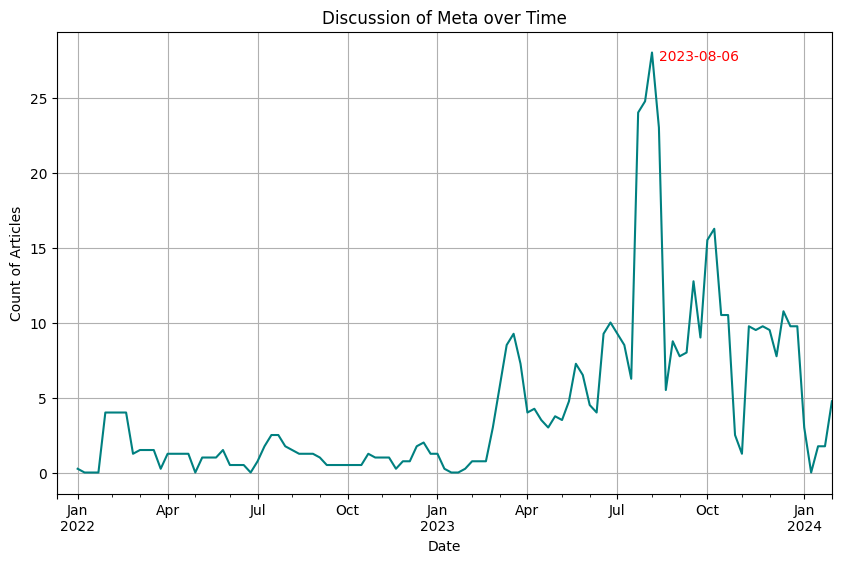

In [353]:
plt.figure(figsize=(10, 6))  # Adjust figure size if needed

# Smooth the time series data using a rolling window average with a window size of 4 weeks
smoothed_count = count_by_date_meta.resample('W').sum().rolling(window=4).mean()

# Plot the smoothed data
smoothed_count.plot(kind='line', color='teal')

plt.title('Discussion of Meta over Time')
plt.xlabel('Date')
plt.ylabel('Count of Articles')
plt.grid(True)

# Add labels where y-value goes above 25
threshold = 27
for date, count in smoothed_count.items():
    if count > threshold:
        plt.annotate(text=f'{date.strftime("%Y-%m-%d")}', xy=(date, threshold), xytext=(5, 5), textcoords='offset points', color='red')

plt.show()


## Named Entity Recognition - People

In [303]:
nlp = spacy.load("en_core_web_lg")

In [306]:
def spacy_extract_people(text):
    doc = nlp(text)
    people = [ent.text for ent in doc.ents if ent.label_ == "PERSON"]
    return people

In [307]:
test_text = "The CEO of Apple is Tim Cook. Elon Musk owns Tesla."
print(spacy_extract_people(test_text))

['Tim Cook', 'Elon Musk']


In [308]:
df['persons'] = df['title_and_text'].parallel_apply(spacy_extract_people)

In [309]:
df_persons =  df[df['persons'].apply(lambda x: len(x) > 0)].reset_index(drop=True)

In [311]:
df_persons_exploded = df_persons.explode('persons')
print("The top 20 persons detected by spaCy are:")
df_persons_exploded['persons'].value_counts().head(20)

The top 20 persons detected by spaCy are:


Sam             752
Musk            733
AI              393
Product Hunt    311
Rishi           127
Bard            119
Bill             97
Trump            73
Bing AI          67
Mark             63
Bing             50
Joe              49
Verdict          45
Gore             45
Sam AI           40
Bill AI          39
Xi               35
Musk AI          34
Harry Potter     33
Nick Cave        31
Name: persons, dtype: int64

In [ ]:
sam = df_persons_exploded[df_persons_exploded['persons']=='Sam'].reset_index(drop=True)
sam = sam[['raw_text', 'title_and_text', 'date']]
print(sam.shape[0])

# Extract the text column as a list
texts = sam['raw_text'].tolist()#meta['title_and_text'].tolist()

# First level of summarization (you might need to adjust the batch_size based on your text sizes and limits)
initial_summaries = batch_summarize(texts, bart_pipe, batch_size=50)  # Adjust batch_size as needed

combined_text = ' '.join(texts)

# Truncate the combined text to fit within the model's maximum input length
max_input_length = 1024  # Adjust this value according to the model's maximum input length
truncated_text = combined_text[:max_input_length]

# Initialize summarization pipeline
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Generate summary for the truncated text
summary = summarizer(truncated_text, max_length=130, min_length=30, do_sample=False)
print(summary)

# Second level of summarization - summarizing the summaries
final_summary = bart_pipe(' '.join(initial_summaries), max_length=150, min_length=30, do_sample=False)

print(final_summary[0]['summary_text'])

In [446]:
sam = df_persons_exploded[df_persons_exploded['persons']=='Sam'].reset_index(drop=True)
sam = sam[['raw_text', 'title_and_text', 'date']]
print(sam.shape[0])

752


In [317]:
# Extract the text column as a list
texts = sam['raw_text'].tolist()#meta['title_and_text'].tolist()

# First level of summarization (you might need to adjust the batch_size based on your text sizes and limits)
initial_summaries = batch_summarize(texts, bart_pipe, batch_size=50)  # Adjust batch_size as needed

In [323]:
combined_text = ' '.join(texts)

In [328]:
# Truncate the combined text to fit within the model's maximum input length
max_input_length = 1024  # Adjust this value according to the model's maximum input length
truncated_text = combined_text[:max_input_length]

# Initialize summarization pipeline
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Generate summary for the truncated text
summary = summarizer(truncated_text, max_length=130, min_length=30, do_sample=False)
print(summary)

[{'summary_text': 'Sam ready invest S News Agency Sam ready to invest in news agency. Sam board open possible return Sam board opens up possible return. Sam dismissal Felt hurt angry Mint How collapse Sam empire AI The Times How collapseSam empire AI  The Times Sam possible return What leading Sam reinstatement mean future industry News.'}]


In [318]:
# Second level of summarization - summarizing the summaries
final_summary = bart_pipe(' '.join(initial_summaries), max_length=150, min_length=30, do_sample=False)

In [319]:
print(final_summary[0]['summary_text'])

How Sam fired snapped return along new board. Sam could lead global around AI regulation. You could parachute onto island full come back five king. Artificial intelligence profit power is Sam apocalypse.


In [320]:
sam_summary = final_summary[0]['summary_text']

result = pipe(sam_summary)
print("The sentiment on Sam Altman is", result[0]['label'])

The sentiment on Sam Altman is neutral


In [321]:
# What is the sentiment for the total meta articles?
sentiments = [pipe(doc)[0]['label'] for doc in sam['title_and_text']]
sentiment_counts = Counter(sentiments)
sentiment_counts

Counter({'neutral': 678, 'negative': 42, 'positive': 32})

In [329]:
sam['date'] = pd.to_datetime(sam['date'])

# Group by 'date' and count the occurrences of 'title_and_text'
count_by_date = sam.groupby('date')['title_and_text'].count()

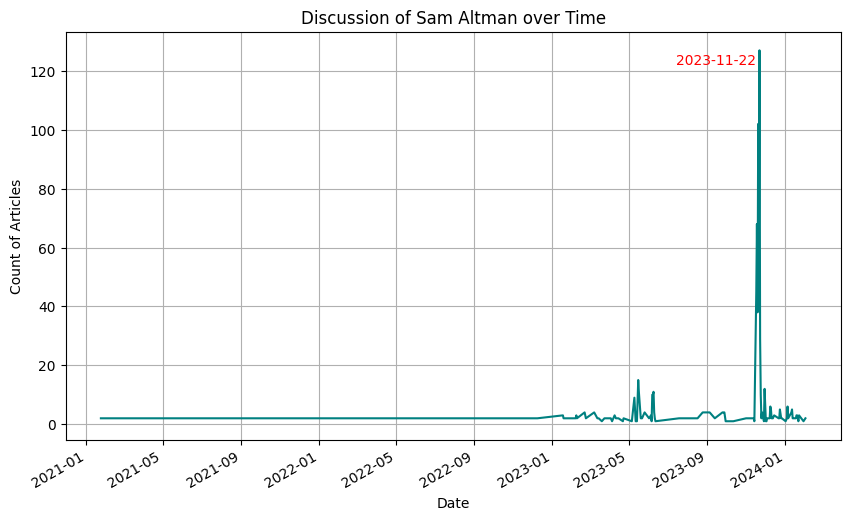

In [340]:
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
count_by_date.plot(kind='line', color='teal')
plt.title('Discussion of Sam Altman over Time')
plt.xlabel('Date')
plt.ylabel('Count of Articles')
plt.grid(True)

# Add labels where y-value goes above 120
threshold = 120
for date, count in count_by_date.items():
    if count > threshold:
        plt.annotate(text=f'{date.strftime("%Y-%m-%d")}', xy=(date, threshold), xytext=(-60, 5), textcoords='offset points', color='red')

plt.show()


## Named Entity Recognition - GPE (Locations)

In [420]:
def spacy_extract_locations(text):
    doc = nlp(text)
    locations = [ent.text for ent in doc.ents if ent.label_ == "GPE"]
    return locations

In [421]:
df['locations'] = df['title_and_text'].parallel_apply(spacy_extract_locations)

In [422]:
df_locations =  df[df['locations'].apply(lambda x: len(x) > 0)].reset_index(drop=True)

In [423]:
df_locations.head(100)

,url,date,language,title,text,title_and_text,organizations,raw_text,text_lower,persons,locations
0,https://clarkcountyblog.com/uncategorized/1663...,2021-06-12,en,Conversational AI Market Covid Impact analysis...,Conversational AI Market Covid Impact analysis...,Conversational AI Market Covid Impact analysis...,[],Conversational AI Market Covid Impact analysis...,conversational ai market covid impact analysis...,[],[Clark County]
1,https://exbulletin.com/world/health/2137318/,2023-05-06,en,Artificial intelligence early breast cancer US,Artificial intelligence early breast cancer US,Artificial intelligence early breast cancer US...,[],Artificial intelligence early breast cancer US,artificial intelligence early breast cancer us,[],"[US, US]"
2,https://finance.yahoo.com/news/us-looking-nvid...,2023-12-11,en,US Is Looking Into AI Chips China,US Is Looking Into AI Chips China,US Is Looking Into AI Chips China US Is Lookin...,[],US Is Looking Into AI Chips China,us is looking into ai chips china,[],"[US, China, US, China]"
3,https://japantoday.com/category/national/sushi...,2023-03-02,en,chain AI camera system licking scandal Japan T...,chain AI camera system licking scandal Japan T...,chain AI camera system licking scandal Japan T...,[],chain AI camera system licking scandal Japan T...,chain ai camera system licking scandal japan t...,[],"[Japan, Japan]"
4,https://nordot.app/901743325431283712,2022-05-24,en,AI million illegally facial BANG,AI million illegally facial BANG,AI million illegally facial BANG AI million il...,[],AI million illegally facial BANG,ai million illegally facial bang,[],[BANG]
...,...,...,...,...,...,...,...,...,...,...,...
95,https://www.cbsnews.com/newyork/news/ai-counte...,2023-12-12,en,trillion worth counterfeit sold year Can AI he...,trillion worth counterfeit sold year Can AI he...,trillion worth counterfeit sold year Can AI he...,[],trillion worth counterfeit sold year Can AI he...,trillion worth counterfeit sold year can ai he...,[],[New York]
96,https://www.chinatechnews.com/2022/09/07/81447...,2022-09-07,en,US threaten timely release future AI chip Game...,US threaten timely release future AI chip Game...,US threaten timely release future AI chip Game...,"[AI chips Game News, AI chips Game News]",US threaten timely release future AI chips Gam...,us threaten timely release future ai chip game...,[],"[US, US]"
97,https://www.focustechnica.com/sanna-marin-the-...,2023-12-28,en,popular former prime minister Finland powerful...,popular former prime minister Finland powerful...,popular former prime minister Finland powerful...,[AI],popular former prime minister Finland powerful...,popular former prime minister finland powerful...,[],"[Finland, Finland]"
98,https://www.gadgets360.com/internet/news/googl...,2023-08-31,en,Generative AI Search Japan Will Show Text Imag...,Generative AI Search Japan Will Show Text Imag...,Generative AI Search Japan Will Show Text Imag...,[],Generative AI Search Japan Will Show Text Imag...,generative ai search japan will show text imag...,[],"[Japan, Japan]"


In [425]:
df_locations_exploded = df_locations.explode('locations')
print("The top 20 locations detected by spaCy are:")
df_locations_exploded['locations'].value_counts().head(10)

The top 20 locations detected by spaCy are:


US              4193
China           1307
Japan            359
Clark County     184
Canada           183
Russia           171
Colorado         158
New York         105
Boston            62
Hong              57
Name: locations, dtype: int64